This example is available as a jupyter notebook [here](https://github.com/SimiPixel/x_xy_v2/blob/main/docs/notebooks/knee_joint_translational_dof.ipynb).

And on Google Colab [here](https://colab.research.google.com/github/SimiPixel/x_xy_v2/blob/main/docs/notebooks/knee_joint_translational_dof.ipynb)

Setup the environment if this is executed on Google Colab.

*Make sure to change the runtime type to `GPU`. To do this go to `Runtime` -> `Change runtime type` -> `GPU`*

Otherwise, rendering won't work in Google Colab.

In [1]:
import os

try:
    import google.colab
    IN_COLAB = True
except:
    IN_COLAB = False

if IN_COLAB:
    os.system("pip install --quiet 'x_xy[muj] @ git+https://github.com/SimiPixel/x_xy_v2'")
    os.system("pip install --quiet mediapy")

In [1]:
import x_xy
# automatically detects colab or not
x_xy.utils.setup_colab_env()

import jax
import jax.numpy as jnp

import mediapy as media

from x_xy.algorithms.generator import transforms

def show_video(sys, xs, **kwargs):
    media.show_video(x_xy.render(sys, [xs[i] for i in range(0, xs.shape(), 4)], camera="target", width=640, height=480, **kwargs), fps=25)

In [40]:
sys = x_xy.load_example("knee_flexible_imus")

Rendering frames..: 100%|██████████| 1/1 [00:00<00:00, 32.06it/s]


""

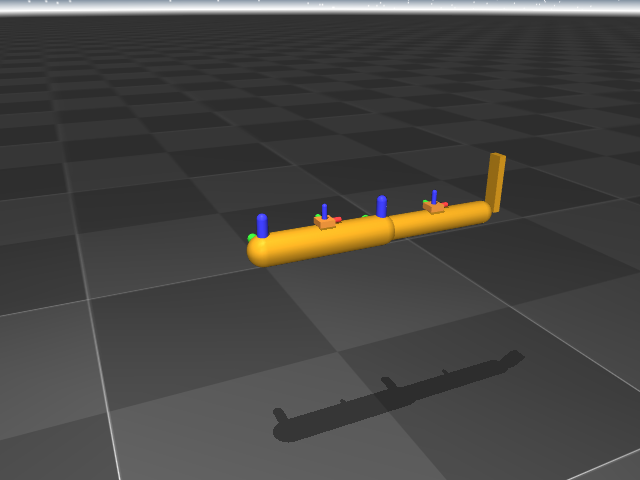

In [41]:
media.show_image(x_xy.render(sys, camera="target", height=480, width=640)[0])

In [27]:
T = 20.0
T_crop = 4.0
T_initial_nomotion = 2.0

config = x_xy.RCMG_Config(t_min=0.1, t_max=0.75, T=T+T_crop, ang0_min=0.0, ang0_max=0.0, pos_min=-1.0, pos_max=1.0, dpos_max=0.5)
config = x_xy.concat_configs([config.to_nomotion_config(), config], [T_initial_nomotion])

P_gains = {
    "free": jnp.array(3 * [50.0] + 3*[200.0]),
    "ry": jnp.array([50.0])
}

def setup_fn(key, sys: x_xy.System):
    link_damping = sys.link_damping
    link_spring_stiffness = sys.link_spring_stiffness

    idx_map = sys.idx_map("d")
    # randomize damping and stiffness of IMU attachment
    for link_name in ["imu1", "imu2", "_imu1", "_imu2"]:
        # spherical joints
        if link_name[0] == "_":
            stiff_min, stiff_max = .2, .4
        else: # p3d joints
            stiff_min, stiff_max = 25.0, 75.0
        key, c1, c2 = jax.random.split(key, 3)

        slice = idx_map[link_name]
        link_spring_stiffness = link_spring_stiffness.at[slice].set(jax.random.uniform(c1, (3,), minval=stiff_min, maxval=stiff_max))
        link_damping = link_damping.at[slice].set(link_spring_stiffness[slice] * jax.random.uniform(c2, (3,), minval=0.05, maxval=0.2))

    return sys.replace(link_damping=link_damping, link_spring_stiffness=link_spring_stiffness)


def finalize_fn(key, q, xs, sys):
    X = dict()
    for imu in ["imu1", "imu2"]:
        key, consume = jax.random.split(key)
        X[imu] = x_xy.imu(
            xs.take(sys.name_to_idx(imu), 1),
            sys.gravity,
            sys.dt,
            consume,
            noisy=True
        )
    y = dict()
    # tibia to femur; child to parent
    y["tibia"] = x_xy.transform_mul(xs.take(sys.name_to_idx("femur"), 1), x_xy.transform_inv(xs.take(sys.name_to_idx("tibia"), 1))).rot

    # truncate from T + T_crop seconds to T
    crop = int(T_crop / sys.dt)
    X, y, q, xs = jax.tree_map(lambda arr: arr[crop:], (X, y, q, xs))
    return (X, y), (q, xs, sys)


gen = x_xy.GeneratorPipe(
    x_xy.GeneratorTrafoRandomizePositions(),
    transforms.GeneratorTrafoSetupFn(setup_fn),
    transforms.GeneratorTrafoDynamicalSimulation(P_gains, ["_imu1", "_imu2"]),
    transforms.GeneratorTrafoFinalizeFn(finalize_fn),
    x_xy.GeneratorTrafoRemoveInputExtras(sys),
    x_xy.GeneratorTrafoRemoveOutputExtras()
)(config)

In [42]:
(X, y), (q_obs, xs_obs, sys_obs) = jax.jit(gen)(jax.random.PRNGKey(2))

In [43]:
show_video(sys_obs, xs_obs, show_floor=False)

Rendering frames..: 100%|██████████| 500/500 [00:01<00:00, 290.52it/s]


In [44]:
sys_frozen = sys_obs.replace(link_types=["frozen", "spherical", "p3d", "frozen", "spherical", "p3d"])

def freeze_x(q_obs):
    q_frozen = jnp.concatenate(tuple(q_obs[:, sys_obs.idx_map("q")[name]] for name in ["_imu1", "imu1", "_imu2", "imu2"]), axis=-1)
    return jax.vmap(lambda q: x_xy.algorithms.forward_kinematics_transforms(sys_frozen, q)[0])(q_frozen)

In [45]:
show_video(sys_frozen, freeze_x(q_obs))

Rendering frames..: 100%|██████████| 500/500 [00:03<00:00, 162.16it/s]
